# Introduzione

Lo scopo di questo progetto prevede la realizzazione di una CycleGan per il task di neural style transfer(NST), in particolare per l'image to image translation, da foto satellitari a mappe e viceversa. Le soluzioni comuni per il task prevedono l'impiego di GANs condizionate, in cui il fattore condizionante è un immagine nello stile che si vuole applicare all'immagine di partenza, con un approccio all'apprendimento supervisionato. Questo tipo di approccio seppur efficace ha delle limitazioni come la riduzione dello spazio delle ipotesi dell'output generato dovuto al fattore condizionante, e tra tutti la difficoltà nella creazione di dataset annotati in cui per ogni immagine di contenuto (input) vi deve essere associata una immagine di stile(fattore condizionante).

L'impiego di una CycleGan propone una risoluzione del compito con un approccio non supervisionato, che mira a ridurre se non eliminare le limitazioni dell'approcio sopra citato, introducendo il concetto di consistenza di ciclo, ovvero se mappo una immagine del dominio A nel dominio B, facendo la mappatura inversa dovrei riottenere l'immagine di partenza.

La CycleGan per mappare un'immagine da un dominio A ad un dominio B e viceversa mantenendo la consistenza di ciclo sfrutta un'architettura composta da due generatori e due discriminatori.

Per distinguerci abbiamo pensato di proporre due versioni della CycleGan, mantenendo fissa l'architettura dei discriminatori e sperimentando con quella riguardante i generatori.
La prima versione sfrutta una Resnet come generatore mentre la seconda una U-Net, mantendo come discrimiantore una PatchGan.

Tali architetture verrano approfondite nelle apposite sezioni.

In [ ]:
!pip install -q alibi[tensorflow]
!pip install tf_explain

In [ ]:
import tensorflow as tf
import matplotlib.pyplot as plt
import tensorflow_datasets as tfds # libreria contenente il dataset utilizzato per il progetto
import os
import shutil
import random
import numpy as np
import time
from IPython.display import display, Image
import pickle
import alibi
from tf_explain.core.grad_cam import GradCAM # libreria usata per la trasparenza algoritmica
import imageio
import glob
import tensorflow_docs.vis.embed as embed
from PIL import Image as PIL_IMAGE
from google.colab import drive
drive.mount('/content/drive') # utilizzo di google drive per la condivisione e il salvataggio dei file

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 522.1/522.1 kB 4.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 116.3/116.3 kB 5.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 489.9/489.9 MB 1.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 98.5/98.5 MB 8.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.5/5.5 MB 52.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 440.7/440.7 kB 26.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.7/1.7 MB 39.1 MB/s eta 0:00:00
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
tf-keras 2.15.1 requires tensorflow<2.16,>=2.15, but you have tensorflow 2.14.1 which is incompatible.
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 43.6/43.6 kB 2.0 MB/s eta 0:00:00
Mounted at /content/drive


# Scaricamento del dataset e pre-processing

Il dataset da noi utilzzato è composto da foto satellitari e mappe opportunamente divisi in set di addestramento e di valutazione; ogni set ha la propria controparte per il dominio A (foto satellitari) e per il dominio B (mappe). E' composto da **1096** immagini per entrambi i set di addestramento e **1098** immagini per entrambi i set di valutazione.

Per i nostri scopi andremo ad utilizzare solamente il **30**% dei campioni del dataset originario (**329** campioni per ogni set), specificando tale suddivisione al momento del caricamento del dataset.

In [ ]:
batch_size= 1

# lista che definisce la percentuale di campioni da caricare per ogni set
split_list=['trainA[70%:]', 'testA[70%:]', 'trainB[70%:]', 'testB[70%:]']

# train_ds_A e test_ds_A conterranno foto satellitari mentre train_ds_B e test_ds_B mappe
train_ds_A, test_ds_A, train_ds_B, test_ds_B = tfds.load('cycle_gan/maps', split=split_list, shuffle_files=True)

# si verifica che i dataset di addestramento e valutazione per ogni controparte siano equilibrati
print('\nNumero campioni per dataset:')
print('train_A : {}'.format(len(train_ds_A)))
print('train_B : {}'.format(len(train_ds_B)))
print('test_A : {}'.format(len(test_ds_A)))
print('test_B : {}'.format(len(test_ds_B)))

# si verifica la dimensione originale dei campioni prima del pre-processing
print('\nShape campioni prima del pre-processing:' )
print('train_A : {}'.format(next(iter(train_ds_A))['image'].shape))
print('train_B : {}'.format(next(iter(train_ds_B))['image'].shape))
print('test_A : {}'.format(next(iter(test_ds_A))['image'].shape))
print('test_B : {}'.format(next(iter(test_ds_B))['image'].shape))

Dl Completed...: 0 url [00:00, ? url/s]

Dl Size...: 0 MiB [00:00, ? MiB/s]

Extraction completed...: 0 file [00:00, ? file/s]

Generating splits...:   0%|          | 0/4 [00:00<?, ? splits/s]

Generating trainA examples...:   0%|          | 0/1096 [00:00<?, ? examples/s]

Shuffling /root/tensorflow_datasets/cycle_gan/maps/incomplete.BRF2R5_3.0.0/cycle_gan-trainA.tfrecord*...:   0%…

Generating trainB examples...:   0%|          | 0/1096 [00:00<?, ? examples/s]

Shuffling /root/tensorflow_datasets/cycle_gan/maps/incomplete.BRF2R5_3.0.0/cycle_gan-trainB.tfrecord*...:   0%…

Generating testA examples...:   0%|          | 0/1098 [00:00<?, ? examples/s]

Shuffling /root/tensorflow_datasets/cycle_gan/maps/incomplete.BRF2R5_3.0.0/cycle_gan-testA.tfrecord*...:   0%|…

Generating testB examples...:   0%|          | 0/1098 [00:00<?, ? examples/s]

Shuffling /root/tensorflow_datasets/cycle_gan/maps/incomplete.BRF2R5_3.0.0/cycle_gan-testB.tfrecord*...:   0%|…

Dataset cycle_gan downloaded and prepared to /root/tensorflow_datasets/cycle_gan/maps/3.0.0. Subsequent calls will reuse this data.

Numero campioni per dataset:
train_A : 329
train_B : 329
test_A : 329
test_B : 329

Shape campioni prima del pre-processing:
train_A : (600, 600, 3)
train_B : (600, 600, 3)
test_A : (600, 600, 3)
test_B : (600, 600, 3)


## Pre-processing

I dataset di addestramento e valutazione sono stati opportunamente normalizzati tenendo conto in parte dell'approccio seguito dai paper: [pix2pix](https://arxiv.org/pdf/1611.07004), e [image-to-image translation using CycleGan](https://arxiv.org/pdf/1703.10593).

I dataset originari organizzano i campioni in dizionari con la seguente struttura:


*   'image' : immagine
*   'label': etichetta

Abbiamo provveduto oltre che alla normalizzazione dei dataset alla loro ristrutturazione, andando ad creare una dataset che contesse solamente i campioni normalizzati, escludendo l'uso del dizionario e delle label, superflue per il tipo di apprendimento utilizzato.


Per entrambi i dataset i campioni sono stati ridimensionati a una dimensione pari a **256x256**, rispetto alla **600x600** originale, successivamente normalizzati nell'intervallo **[-1,1]**, e infine organizzati in batch di dimensione pari a **1**.

 Per il dataset di addestramente inoltre sono state introdotte anche operazioni di data augmentation come il **random_crop** e il **random_flip_left_right** le quali
aiutano il modello ad avere una maggiore capacità generalizzativa non andando a ledere quella che è la qualità dell'immagine, cosa che sarebbe accaduta introducendo tecniche che avrebbero agito sui colori e sul contrasto dell'immagine.

In [ ]:
''' funzione di normalizzazione per i dataset di addestramento che da prima porta
 l'immagine ad una dimensione di 286x286, poi vi applica le operazioni di data augmentation,
 infine l'immagine ridimensionata 256x256 viene normalizzata.
'''
def normalize_train(image):
  image = tf.image.resize(image, [286,286])
  image = tf.image.random_flip_left_right(image)
  image = tf.image.random_crop(image, size=[256,256,3])
  return (tf.cast(image, 'float32') / 127.5) - 1.


def normalize_test(image):
  return (tf.cast(tf.image.resize(image, [256,256]), 'float32') / 127.5) - 1.


# tramite la funzione map ristrutturiamo i dataset e ne normalizziamo i campioni oroganizzandoli in batch

train_ds_A_norm = train_ds_A.map(lambda x: normalize_train(x['image']), num_parallel_calls=5).batch(batch_size).prefetch(batch_size)
train_ds_B_norm = train_ds_B.map(lambda x: normalize_train(x['image']), num_parallel_calls=5).batch(batch_size).prefetch(batch_size)

test_ds_A_norm = test_ds_A.map(lambda x: normalize_test(x['image']), num_parallel_calls=5).batch(batch_size)
test_ds_B_norm = test_ds_B.map(lambda x: normalize_test(x['image']), num_parallel_calls=5).batch(batch_size)


Shape campioni dopo il pre-processing: 

train_A : (1, 256, 256, 3)
train_B : (1, 256, 256, 3)
test_A : (1, 256, 256, 3)
test_B : (1, 256, 256, 3)


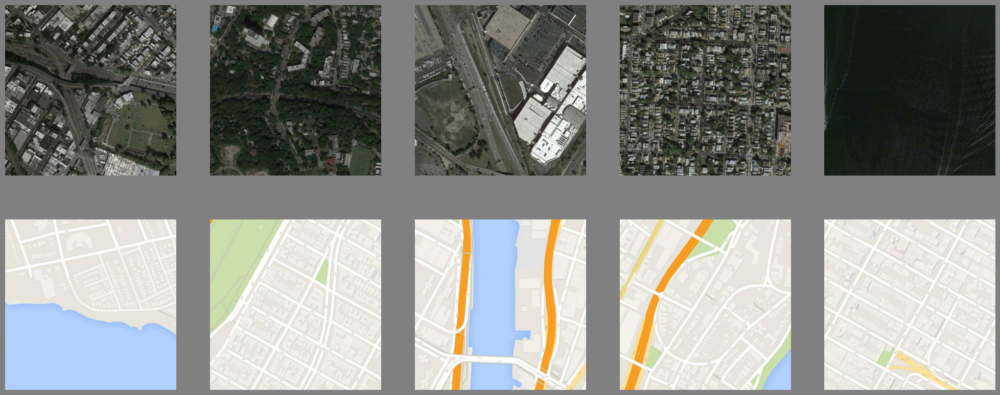

In [ ]:
# si verifica la struttura dei campioni dopo il pre-processing (normalizzazione e organizzazione in batch)
print('Shape campioni dopo il pre-processing: \n' )
print('train_A : {}'.format(next(iter(train_ds_A_norm)).shape))
print('train_B : {}'.format(next(iter(train_ds_B_norm)).shape))
print('test_A : {}'.format(next(iter(test_ds_A_norm)).shape))
print('test_B : {}'.format(next(iter(test_ds_B_norm)).shape))


# vengono stampati 5 campioni di esempio per ognuno dei dataset di addestramento
# train_ds_A foto satellitari
# train_ds_B mappe

plt.figure(figsize=(25,10), facecolor='gray')

for i, (train_A, train_B) in enumerate(zip(train_ds_A.take(5), train_ds_B.take(5))):
    ax = plt.subplot(2, 5, i + 1)
    ax = plt.imshow(train_A['image'])
    plt.axis('off')

    bx = plt.subplot(2, 5, i + 5 + 1)
    bx = plt.imshow(train_B['image'])
    plt.axis('off')

plt.show()

In [ ]:
''' i dataset pre-processati vengono salvati su google drive per aggevolare e
 semplificare lo sviluppo della restante parte del progetto
'''

dataset_dict = {'train_ds_A': train_ds_A_norm, 'train_ds_B': train_ds_B_norm
                'test_ds_A': test_ds_A_norm , 'test_ds_B': test_ds_B_norm }

for ds_path, dataset in dataset_dict.items():
  dataset.save('/content/drive/My Drive/Cycle_Gan/pre_processed/' + ds_path)

In [ ]:
 # caricamento dal drive dei dataset pre-processati. Questo evita di dover riscaricare e processare i dataset ogni volta che si utilizza il notebook
train_ds_A = tf.data.Dataset.load('/content/drive/My Drive/Cycle_Gan/pre_processed/train_ds_A')
train_ds_B = tf.data.Dataset.load('/content/drive/My Drive/Cycle_Gan/pre_processed/train_ds_B')
test_ds_A = tf.data.Dataset.load('/content/drive/My Drive/Cycle_Gan/pre_processed/test_ds_A')
test_ds_B = tf.data.Dataset.load('/content/drive/My Drive/Cycle_Gan/pre_processed/test_ds_B')

# Architetture

In questa sezione verrano descritte le architetture che andranno a comporre la CycleGan da addestrare.

Verranno presentate due architetture per il generatore, una per il discriminatore e il layer di InstanceNormalization fondamentale per il task di NST.

## InstanceNormalization

L'InstanceNormalization (IN), proposta nel paper [IN](https://arxiv.org/abs/1607.08022) è una tecnica di normalizzazione che lavora considerando la singola immagine anziché l'intero batch, come invece fa la BatchNormalization (BN). IN normalizza ogni canale di un'immagine individualmente rispetto alla media e alla deviazione standard del canale stesso. All'interno del nostro progetto il suo uso è giustiifcato dal fatto che le immagini sono organizzate in batch di dimensione pari a 1. Vediamo alcuni dei vantaggi portati dall'uso dell IN:



*   Invarianza all'illuminazione: Normalizzando a livello di immagine, si rende l'immagine invariante ai cambiamenti di illuminazione. Questo facilita il mapping degli stili tra domini con differenti condizioni di illuminazione, migliorando la robustezza del modello in scenari reali dove le condizioni di luce possono variare notevolmente.

*   Consistenza stilistica: Normalizzando a livello di immagine si rimuovono le informazioni globali non rilevanti e si preservano le informazioni locali. Questo aiuta nella generazione di immagini con uno stile coerente, poiché le caratteristiche stilistiche locali vengono mantenute intatte, migliorando la qualità dei risultati generati.

* Addestramento stabile: Lavorando sulle singole immagini, si riducono le fluttuazioni dovute alle statistiche del batch. Questo è particolarmente importante in contesti con grandi varietà di immagini, dove le variazioni all'interno del batch possono minare il processo di addestramento.




In [ ]:
class InstanceNormalization(tf.keras.layers.Layer):

  def __init__(self, epsilon=1e-5):
    super(InstanceNormalization, self).__init__()
    self.epsilon = epsilon


  # inizializzazione del livello, scale e offset hanno shape pari al numero di canali
  # il loro impiego per la normalizzazione permette di apprenderetrasformazioni più complessse
  def build(self, input_shape):
    # usato per riadattare la scala dei valori normalizzati
    self.scale = self.add_weight(
        name='scale',
        shape=input_shape[-1:],
        initializer=tf.random_normal_initializer(1., 0.02), # pesi inizializzati con media 1 e deviazione standard 0.02
        trainable=True)

    # usato per riadattare l'offset dei valori normalizzati
    self.offset = self.add_weight(
        name='offset',
        shape=input_shape[-1:],
        initializer='zeros',
        trainable=True)

  def call(self, x):
    # si calcolano media e varianza per ogni canale lungo gli assi 1 e 2 ( lunghezza e altezza)
    mean, variance = tf.nn.moments(x, axes=[1, 2], keepdims=True)
    inv = tf.math.rsqrt(variance + self.epsilon) #inverso della radice quadrata della varianza
    normalized = (x - mean) * inv #si normalizza l'immagine
    return self.scale * normalized + self.offset


## Metodi e parametri di utilità

In questa sezione vedremo i metodi principali utilizzati per costruire le architetture che impiegheremo per la nostra CycleGan.

In [ ]:
# i pesi dei vari livelli verranno inizializzati xon media 0 e deviazione standard 0.02
initializer = tf.random_normal_initializer(0., 0.02)

# metodo usato per ottenere un blocco di downsample
# il blocco è composto da un livello convolutivo, livello di IN , e da una funzione di attivazione
def get_conv_block_enc(activation=tf.keras.layers.LeakyReLU(alpha=0.2), kernel_size=4, strides=2, batch_norm=True, padding='same', **kwargs):
    block = tf.keras.Sequential([
        tf.keras.layers.Conv2D(kwargs['filters'], kernel_size=kernel_size, strides=strides, padding=padding, use_bias=False, kernel_initializer=initializer)
    ])
    if batch_norm:
        block.add(InstanceNormalization())
    block.add(activation)
    return block

# metodo usato per ottenere un blocco di upsample
# il blocco è composto da un livello convolutivo trasposto, livello di IN , livello di dropout e da una funzione di attivazione
def get_conv_block_dec(activation=tf.keras.layers.ReLU(), dropout=False, kernel_size=4, strides=2, padding='same', **kwargs):
    block = tf.keras.Sequential([
        tf.keras.layers.Conv2DTranspose(kwargs['filters'], kernel_size=kernel_size, strides=strides, padding=padding, use_bias=False, kernel_initializer=initializer)
    ])
    block.add(InstanceNormalization())
    if dropout:
        block.add(tf.keras.layers.Dropout(0.5))
    block.add(activation)
    return block


# metodo usato per ottenere i layer che costituiranno un blocco residuale
# il blocco contiene un livello di padding riflettente lungo lunghezza e altezza, un livello convolutivo e un livello di IN
def get_block(filters=256, kernel_size=3, padding='valid'):
    return [
        tf.keras.layers.Lambda(lambda x: tf.pad(x, paddings=[[0, 0], [1, 1], [1, 1], [0, 0]], mode='REFLECT')),
        tf.keras.layers.Conv2D(filters, kernel_size, padding=padding, kernel_initializer=initializer, use_bias=False),
        InstanceNormalization()
    ]


# metodo usato per costruire un blocco residuale
# il blocco è costituto da 2 gruppi di layer ottenuti tramite il metodo sopra descritto, seperati da una funzione di attivazione
def get_residual_block(filters, kernel_size, padding):
  block = tf.keras.Sequential()
  for layer in get_block(filters, kernel_size, padding):
    block.add(layer)
  block.add(tf.keras.layers.ReLU())

  for layer in get_block(filters, kernel_size, padding):
    block.add(layer)
  return block

## Generatori

In questa sezione vedremo le due architetture proposte come generatori per la nostra CycleGan. In particolare andremo ad analizzare la loro strutturazione.

### U-Net

La U-Net è un'architettura encoder-decoder che introduce delle skip connections fra i livelli dell'encoder e del decoder. Queste connessioni concatenano i livelli delle due reti lungo l'asse dei filtri. L'uso di una U-Net è dovuto alle limitazioni dell'architettura encoder-decoder classica per il task in questione. Con l'architettura classica, si cerca di ottenere una rappresentazione a bassa dimensionalità nello spazio latente dell'immagine di partenza per poi ricostruirla. Tuttavia, questo approccio può portare alla perdita di dettagli importanti, specialmente per compiti dove la preservazione della struttura dell'immagine è fondamentale. L'impiego delle skip connections permette di aggirare questo problema, propagando dettagli importanti per la ricostruzione dell'immagine mentre se ne varia l'impronta stilistica. Inoltre, queste connessioni aiutano il gradiente a fluire meglio, riducendo i tempi di convergenza e rendendo l'addestramento più stabile, con risultati di buona qualità.

Abbiamo sperimentato usando una U-Net depotenziata per vedere se nonostante la capacità ridotta i risultati ottenuti perdessero notevolmente di qualità o meno.

Larchitettura originale è composta dai seguenti blocchi, connessi poi fra loro grazie alle skip connections:

*   encoder : C64-C128-C256-C512-C512-C512-C512-C512
*   decoder: CD512-CD512-CD512-C512-C256-C128-C64


La nostra versione:


*   encoder : C64-C128-C256-C256-C256-C512-C512
*   decoder: CD512-CD256-CD256-C256-C128-C64

Cx è un blocco di x filtri composto da livello convolutivo, livelli di IN (tranne il primo blocco dell'encoder), e un livello di attivazione dove per l'encoder si usa la LeakyRelu con slope pari a **0.2**, mentre per il decoder si usa la ReLU.

CDx è un blocco come quello sopra descritto con l'aggiunta di un livello di dropout prima del livello di attivazione.

L'encoder riduce la dimensione dell'immagine di un fattore **2** mentre il decoder l'aumenta di un fattore **2** . I livelli convolutivi usano stride pari a **2** e kernle_size pari a **4**.

Dopo l'ultimo livello del decoder si applica un livello convolutivo che rimappa l'immagine al numero corretto di canali (3) e vi applica la funzione di attivazione **tanh**.





In [ ]:
def u_net_generator(input_shape=(256,256,3)):

  #filter_list = [(64, 1), (128, 1), (256, 1), (512, 5)]
  #filter_list_dec = [(512, 4), (256, 1), (128, 1), (64, 1)]

  filter_list = [(64, 1), (128, 1), (256,3), (512,2)]
  filter_list_dec = [(512, 1), (256, 3), (128, 1), (64, 1)]


  input = tf.keras.Input(shape=input_shape)
  x = input

  #encoder
  # costruzione dell'encoder seguendo la nostra versione proposta
  # si usa il metodo get_conv_block_enc per ottenere blocchi di downsample
  encoder_output = []
  for i, (filters, rep) in enumerate(filter_list):
    for _ in range(rep):
      x = get_conv_block_enc(filters=filters, batch_norm=(not (i == 0)))(x)
      encoder_output.append(x)

  #decoder
  # si costruisce il decoder similmente a quanto fatto con l'encoder
  # ogni livello i dell'encoder viene concatenato con il livello n-i del decoder
  cnt = 0
  for i, (filters, rep) in enumerate(filter_list_dec):
    for _ in range(rep):
      x = get_conv_block_dec(filters=filters, dropout=(i < 3))(x)
      x = tf.concat([x, encoder_output[-(cnt + 2 )]], axis=input_shape[-1]) # concatenazione lungo l'asse dei filtri
      cnt += 1

  # tale livello rimappa l'immagine ricostruita al numero di canali iniziali e vi applica la funzione tanh
  x = tf.keras.layers.Conv2DTranspose(filters=input_shape[-1], kernel_size=4, strides=2, padding='same',
                                      kernel_initializer=initializer,  activation='tanh', use_bias=False)(x)

  return tf.keras.Model(inputs=input, outputs=x)

model = u_net_generator()
model.summary()


Model: "model"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_1 (InputLayer)        [(None, 256, 256, 3)]        0         []                            
                                                                                                  
 sequential (Sequential)     (None, 128, 128, 64)         3072      ['input_1[0][0]']             
                                                                                                  
 sequential_1 (Sequential)   (None, 64, 64, 128)          131328    ['sequential[0][0]']          
                                                                                                  
 sequential_2 (Sequential)   (None, 32, 32, 256)          524800    ['sequential_1[0][0]']        
                                                                                              

### ResNet

La ResNet (Residual Network) è stata introdotta per mitigare il problema della possibile degradazione della performance dovuto all'aumentare della profondità delle reti neurali, e andando ad avere gradienti sempre più piccoli (gradienti evenescenti). A differenza delle architetture tradizionali, dove ogni layer produce un output che viene passato al successivo, una ResNet utilizza connessioni residue per aggiungere l'input originale a quello dell'output del layer, creando un "blocco residuo". Questa tecnica permette al modello di apprendere le modifiche rispetto all'input originale anziché cercare di apprendere direttamente l'intero mapping, andando a supportare la creazione di reti anche molto profonde, un miglior flusso del gradiente, e una miglior capacità generalizzativa.

Per il nostro caso d'uso abbiamo utilizzato una ResNet composta da **9** blocchi residuali. Tali blocchi sono preceduti da un livello di padding riflettente e **3** blocchi di dowsample, e sono succeduti da **2** blocchi di upsample, seguiti da un livello di padding riflettente e un livello convolutivo che rimappa l'immagine al numero di canali iniziale e vi aplica la funzione di attivazione tanh.

Nel complesso l'architettura usata è la seguente:

c7s1-64,d128,d256,R256*9,u128,u64,c7s1-3

dove:

* dx indica un blocco di downsample con x filtri, stride pari a **2** e kernel_size pari a **3**, mentre ux è la controparte usata per l'upsample

* Rx è un blocco residuale composta da x filtri con kernel_size pari a **3**

* c7s1-x indica un blocco convolutivo con kernel_size pari a **7**, stride pari a **1** e un numero di filtri pari x.

I blocchi di upsample e downsample usati sono della stessa struttura impiegata anche per la U-NET, mentre i blocchi residuali sono composti da **2** blocchi della forma: livello di padding riflettente, livello convolutivo e livello di IN;
separati da un livelli di attivazione come come per gli altri blocchi è la ReLU.

In [ ]:
def resnet_generator(input_shape=(256,256,3)):
  activation = tf.keras.layers.ReLU()
  input = tf.keras.Input(shape=input_shape)
  x = input
  x = tf.keras.layers.Lambda(lambda x: tf.pad(x, paddings=[[0, 0], [3, 3], [3, 3], [0, 0]], mode='REFLECT'))(x)
  x = get_conv_block_enc(activation=activation, padding='valid', strides=1, kernel_size=7, filters=64)(x)
  x = get_conv_block_enc(activation=activation, kernel_size=3, filters=128)(x)
  x = get_conv_block_enc(activation=activation, kernel_size=3, filters=256)(x)

  residual_blocks = 0
  if input_shape[0] == 128:
    residual_blocks = 6
  elif input_shape[0] == 256:
    residual_blocks = 9

  for _ in range(residual_blocks):
    residual = x
    x = get_residual_block(kernel_size=3, padding='valid', filters=256, )(x)
    x = tf.keras.layers.add([x, residual])

  x = get_conv_block_dec(kernel_size=3, filters=128)(x)
  x = get_conv_block_dec(kernel_size=3, filters=64)(x)

  x = tf.keras.layers.Lambda(lambda x: tf.pad(x, paddings=[[0, 0], [3, 3], [3, 3], [0, 0]], mode='REFLECT'))(x)
  x = tf.keras.layers.Conv2D(filters=3, kernel_size=7, strides=1, use_bias=False, kernel_initializer=initializer, activation='tanh')(x)


  return tf.keras.Model(inputs=input, outputs=x)

model = resnet_generator()
model.summary()



Model: "model_1"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_2 (InputLayer)        [(None, 256, 256, 3)]        0         []                            
                                                                                                  
 lambda (Lambda)             (None, 262, 262, 3)          0         ['input_2[0][0]']             
                                                                                                  
 sequential_13 (Sequential)  (None, 256, 256, 64)         9536      ['lambda[0][0]']              
                                                                                                  
 sequential_14 (Sequential)  (None, 128, 128, 128)        73984     ['sequential_13[0][0]']       
                                                                                            

## Discriminatori

### PatchGan

In [ ]:
def patch_gan(input_shape=(256,256,3)):
  input = tf.keras.Input(shape=input_shape)
  x = input
  x = get_conv_block_enc(filters=64, batch_norm=False)(x)
  x = get_conv_block_enc(filters=128, )(x)
  x = get_conv_block_enc(filters=256,)(x)

  x = tf.keras.layers.ZeroPadding2D()(x)
  x = get_conv_block_enc(filters=512, strides=1, padding='valid')(x)
  x = tf.keras.layers.ZeroPadding2D()(x)

  x = tf.keras.layers.Conv2D(1, kernel_size=4, strides=1, kernel_initializer=initializer, use_bias=False)(x)

  return tf.keras.Model(inputs=input, outputs=x)

discriminator = patch_gan()
discriminator.summary()

Model: "model_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_3 (InputLayer)        [(None, 256, 256, 3)]     0         
                                                                 
 sequential_27 (Sequential)  (None, 128, 128, 64)      3072      
                                                                 
 sequential_28 (Sequential)  (None, 64, 64, 128)       131328    
                                                                 
 sequential_29 (Sequential)  (None, 32, 32, 256)       524800    
                                                                 
 zero_padding2d (ZeroPaddin  (None, 34, 34, 256)       0         
 g2D)                                                            
                                                                 
 sequential_30 (Sequential)  (None, 31, 31, 512)       2098176   
                                                           

## CycleGan

In [ ]:
class CycleGan(tf.keras.Model):
  def __init__(self, generator_A, generator_B, checkpoint_dir, losses_dir, images_dir, **kwargs):
    super().__init__(kwargs)
    # A -> B
    self.gen_A = generator_A

    # B -> A
    self.gen_B = generator_B

    self.disc_A = patch_gan()
    self.disc_B = patch_gan()

    self.learning_rate = 0.0002
    self.beta_1 = 0.5
    self.beta_2 = 0.999

    self.gen_A_optimizer = tf.keras.optimizers.Adam(self.learning_rate, self.beta_1, self.beta_2)
    self.gen_B_optimizer = tf.keras.optimizers.Adam(self.learning_rate, self.beta_1, self.beta_2)
    self.disc_B_optimizer = tf.keras.optimizers.Adam(self.learning_rate, self.beta_1, self.beta_2)
    self.disc_A_optimizer = tf.keras.optimizers.Adam(self.learning_rate, self.beta_1, self.beta_2)

    #self.checkpoint_dir = '/content/drive/My Drive/Cycle_Gan/_u_net_train_checkpoint/'
    self.checkpoint_dir = checkpoint_dir
    self.checkpoint_prefix = os.path.join(self.checkpoint_dir, 'ckpt')
    self.checkpoint = tf.train.Checkpoint(gen_A=self.gen_A,
                                          gen_B=self.gen_B,
                                          disc_A=self.disc_A,
                                          disc_B=self.disc_B,
                                          gen_A_optimizer=self.gen_A_optimizer,
                                          gen_B_optimizer=self.gen_B_optimizer,
                                          disc_A_optimizer=self.disc_A_optimizer,
                                          disc_B_optimizer=self.disc_B_optimizer)


    self.gens_loss = []
    self.discs_loss = []
    self.cycles_loss = []

    self.image_pool_A = []
    self.image_pool_B = []
    self.pool_size = 60
    self.pool_A_dim = 0
    self.pool_B_dim = 0

    self.losses_dir = losses_dir
    self.images_dir = images_dir
    self.bce = tf.keras.losses.BinaryCrossentropy(from_logits=True)


  def call(self, model='A', inputs=None):
    if model == 'A':
      return self.gen_A(inputs)
    else:
      return self.gen_B(inputs)

  def train(self, datasetA, datasetB, epochs):
    self.restore_checkpoint()
    image_A = next(iter(datasetA))
    image_B = next(iter(datasetB))

    for i in range(len(self.gens_loss), epochs):
      start_time = time.time()
      for batch_A, batch_B in tf.data.Dataset.zip((datasetA, datasetB)):
        loss_dict = self.train_step(batch_A, batch_B)

      self.gens_loss.append((loss_dict['total_gen_A_loss'].numpy(), loss_dict['total_gen_B_loss'].numpy()))
      self.discs_loss.append((loss_dict['disc_A_loss'].numpy(), loss_dict['disc_B_loss'].numpy()))
      self.cycles_loss.append((loss_dict['cycle_A_loss'].numpy(), loss_dict['cycle_B_loss'].numpy()))


      if i % 5 == 0:
        self.save()


      display.clear_output(wait=True)
      print('Time for epoch {} is {:.2f}'.format(i + 1, time.time() - start_time))
      print('Genarator_A loss : {:.2f}, Genarator_B loss : {:.2f}'.format(loss_dict['gen_A_loss'], loss_dict['gen_B_loss']))
      print('Identity_A loss : {:.2f}, Identity_B loss : {:.2f}'.format(loss_dict['identity_A_loss'], loss_dict['identity_B_loss']))
      print('Cycle_A loss : {:.2f}, Cycle_B loss : {:.2f}'.format(loss_dict['cycle_A_loss'], loss_dict['cycle_B_loss']))
      print('Total_gen_A loss : {:.2f}, Total_gen_B loss : {:.2f}'.format(loss_dict['total_gen_A_loss'], loss_dict['total_gen_B_loss']))
      print('Discriminator_A loss : {:.2f}, Discriminator_B loss : {:.2f}'.format(loss_dict['disc_A_loss'], loss_dict['disc_B_loss']))
      self.generate_and_save_images(i + 1, image_A, image_B)


  @tf.function
  def train_step(self, input_A, input_B):

    with tf.GradientTape(persistent=True) as gen_t, tf.GradientTape(persistent=True) as disc_t, tf.device('/GPU:0'):

      # real A -> fake B
      fake_B = self.gen_A(input_A, training=True)

      # real B -> fake A
      fake_A = self.gen_B(input_B, training=True)

      # fake B -> fake A
      cycle_A = self.gen_B(fake_B, training=True)

      # fake A -> fake B
      cycle_B = self.gen_A(fake_A, training=True)

      # real B -> identity B
      identity_A = self.gen_A(input_B, training=True)

      # real A -> identity A
      identity_B = self.gen_B(input_A, training=True)

      # Discriminators

      out_real_A = self.disc_A(input_A, training=True)
      out_real_B = self.disc_B(input_B, training=True)

      out_fake_A = self.disc_A(self.get_disc_image_from_A_pool(fake_A), training=True)
      out_fake_B = self.disc_B(self.get_disc_image_from_B_pool(fake_B), training=True)


      # Loss

      # fake A = B(real B) -> A
      gen_A_loss = self.gen_loss(self.disc_B(fake_B))
      gen_B_loss = self.gen_loss(self.disc_A(fake_A))

      # cycle A = A -> B -> A
      cycle_loss_A = self.cycle_loss(input_A, cycle_A)
      cycle_loss_B = self.cycle_loss(input_B, cycle_B)

      cycle_loss =  cycle_loss_A + cycle_loss_B

      identity_A_loss = self.identity_loss(input_B, identity_A)
      identity_B_loss = self.identity_loss(input_A, identity_B)

      # identity A =  B(real A) -> A
      total_gen_A_loss = gen_A_loss + cycle_loss + identity_A_loss
      total_gen_B_loss = gen_B_loss + cycle_loss + identity_B_loss


      disc_A_loss = self.disc_loss(out_real_A, out_fake_A)

      disc_B_loss = self.disc_loss(out_real_B, out_fake_B)


    # Calculate gradients

    gen_A_gradients = gen_t.gradient(total_gen_A_loss, self.gen_A.trainable_variables)
    gen_B_gradients = gen_t.gradient(total_gen_B_loss, self.gen_B.trainable_variables)

    self.gen_A_optimizer.apply_gradients(zip(gen_A_gradients, self.gen_A.trainable_variables))
    self.gen_B_optimizer.apply_gradients(zip(gen_B_gradients, self.gen_B.trainable_variables))


    disc_A_gradients = disc_t.gradient(disc_A_loss, self.disc_A.trainable_variables)
    disc_B_gradients = disc_t.gradient(disc_B_loss, self.disc_B.trainable_variables)

    self.disc_A_optimizer.apply_gradients(zip(disc_A_gradients, self.disc_A.trainable_variables))
    self.disc_B_optimizer.apply_gradients(zip(disc_B_gradients, self.disc_B.trainable_variables))

    return {'gen_A_loss' : gen_A_loss, 'gen_B_loss' : gen_B_loss,
            'cycle_A_loss' : cycle_loss_A, 'cycle_B_loss' : cycle_loss_B,
            'identity_A_loss' : identity_A_loss, 'identity_B_loss' : identity_B_loss,
            'total_gen_A_loss' : total_gen_A_loss, 'total_gen_B_loss' : total_gen_B_loss,
            'disc_A_loss' : disc_A_loss, 'disc_B_loss' : disc_B_loss}


  def gen_loss(self, y_pred):
    return self.bce(tf.ones_like(y_pred), y_pred)


  def disc_loss(self, y, y_pred):
    real_loss = self.bce(tf.ones_like(y), y)
    fake_loss = self.bce(tf.zeros_like(y_pred), y_pred)

    return (real_loss + fake_loss) * 0.5

  @staticmethod
  def cycle_loss(y, y_cycle):
    loss = tf.keras.losses.MeanAbsoluteError()
    return loss(y_cycle, y) * 10

  @staticmethod
  def identity_loss(y, y_identity):
    loss = tf.keras.losses.MeanAbsoluteError()
    return loss(y_identity, y) * 10 * 0.5


  def get_disc_image_from_A_pool(self, generated_image):
    if self.pool_A_dim < self.pool_size:
      self.pool_A_dim +=1
      self.image_pool_A.append(generated_image)
      return generated_image
    else:
      index = random.randint(0, self.pool_size)
      img_to_return = self.image_pool_A[index]
      self.image_pool_A[index] = generated_image
      return img_to_return

  def get_disc_image_from_B_pool(self,generated_image):
    if self.pool_B_dim < self.pool_size:
      self.pool_B_dim +=1
      self.image_pool_B.append(generated_image)
      return generated_image
    else:
      index = random.randint(0, self.pool_size)
      img_to_return = self.image_pool_B[index]
      self.image_pool_B[index] = generated_image
      return img_to_return


  def save(self):
    self.checkpoint.save(self.checkpoint_prefix)

    for path, loss in self.get_losses().items():
      filepath = os.path.join(self.losses_dir, path)
      with open(filepath, 'wb') as f:
          pickle.dump(loss, f)

  def restore_checkpoint(self):
        # Metodo per il ripristino del checkpoint
        latest_checkpoint = tf.train.latest_checkpoint(self.checkpoint_dir)
        if latest_checkpoint:
          self.checkpoint.restore(latest_checkpoint)

          for path, loss in self.get_losses().items():
            filepath = os.path.join(self.losses_dir, path)
            with open(filepath, 'rb') as f:
                loss.extend(pickle.load(f))

          print(f"Checkpoint restored from {latest_checkpoint}")
        else:
          print("Checkpoint not found. Training from scratch.")

  def generate_and_save_images(self, epoch, test_input_A, test_input_B):
        # Notiamo il parametro "training=False". In questo step stiamo usando il modello in modalità inferenza.
        predictions_A = self.gen_A(test_input_A, training=False)
        predictions_B = self.gen_B(test_input_B, training=False)

        plt.figure(figsize=(10, 10))

        images = [
            (test_input_A[0], 'Real A'),
            (predictions_A[0], 'Generated Image from A to B'),
            (test_input_B[0], 'Real B'),
            (predictions_B[0], 'Generated Image from B to A')
        ]

        for i, (img, title) in enumerate(images, 1):
            plt.subplot(2, 2, i)
            plt.imshow(img* 0.5 + 0.5)
            plt.title(title)
            plt.axis('off')


        if epoch >= 0:
          plt.savefig(self.images_dir + 'image_at_epoch_{:04d}.png'.format(epoch))
        plt.show()


  def get_losses(self):
    return {'Gens_loss': self.gens_loss, 'Cycles_loss': self.cycles_loss, 'Discs_loss': self.discs_loss}


  def get_discs_predictions(self, test_A, test_B):
    disc_A_predictions = {'real': [], 'fake': []}
    disc_B_predictions = {'real': [], 'fake': []}

    for image_batch_A, image_batch_B in zip(test_A, test_B):

      disc_A_predictions['real'].append(tf.reduce_mean(tf.keras.activations.sigmoid(self.disc_A(image_batch_A))).numpy())
      disc_A_predictions['fake'].append(tf.reduce_mean(tf.keras.activations.sigmoid(self.disc_A(self.gen_B(image_batch_B)))).numpy())

      disc_B_predictions['real'].append(tf.reduce_mean(tf.keras.activations.sigmoid(self.disc_B(image_batch_B))).numpy())
      disc_B_predictions['fake'].append(tf.reduce_mean(tf.keras.activations.sigmoid(self.disc_B(self.gen_A(image_batch_A)))).numpy())

    return {'disc_A' : disc_A_predictions, 'disc_B': disc_B_predictions}


## Addestramento

## Addestramento con generatore ResNet

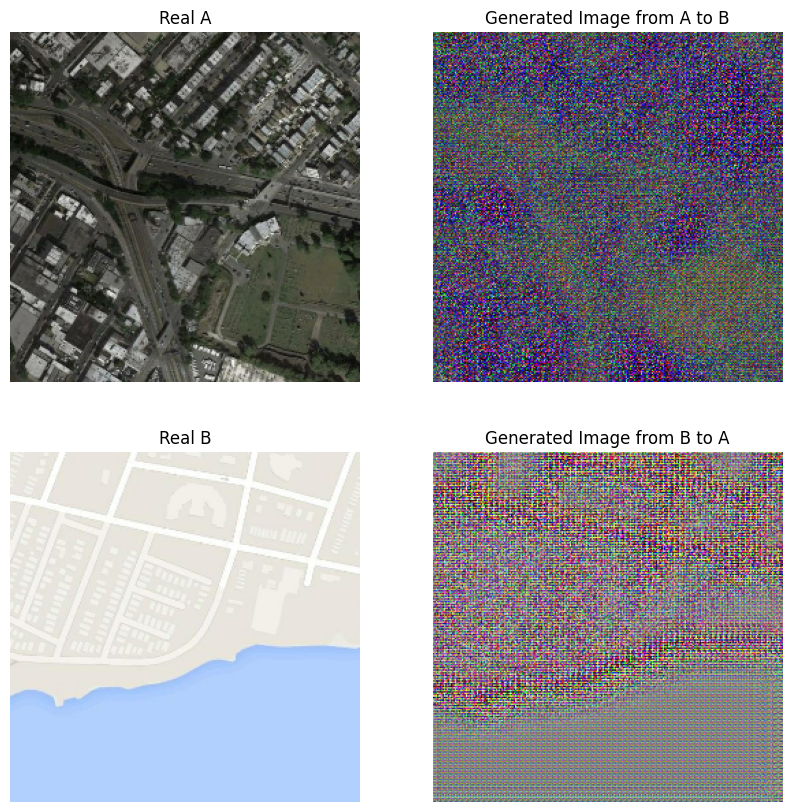

In [ ]:
checkpoint_dir = '/content/drive/My Drive/Cycle_Gan/train_checkpoint/'
losses_dir = '/content/drive/My Drive/Cycle_Gan/losses/'
images_dir = '/content/drive/My Drive/Cycle_Gan/generated_images/'

image_batch_A =  next(iter(train_ds_A))
image_batch_B =  next(iter(train_ds_B))

cycle_gan_with_resnet_generator = CycleGan(resnet_generator(), resnet_generator(), checkpoint_dir=checkpoint_dir, losses_dir=losses_dir, images_dir=images_dir)
cycle_gan_with_resnet_generator.generate_and_save_images(-1, image_batch_A, image_batch_B)



Time for epoch 74 is 211.21
Genarator_A loss : 2.73, Genarator_B loss : 0.33
Identity_A loss : 0.22, Identity_B loss : 0.66
Cycle_A loss : 1.45, Cycle_B loss : 0.83
Total_gen_A loss : 5.22, Total_gen_B loss : 3.27
Discriminator_A loss : 0.86, Discriminator_B loss : 0.10


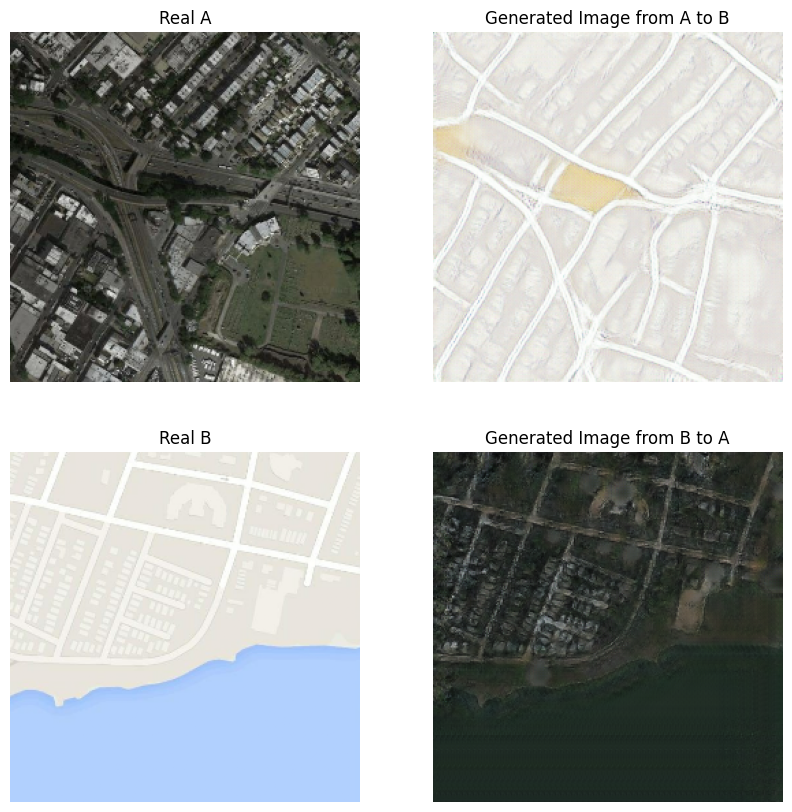

In [ ]:
cycle_gan_with_resnet_generator.train(train_ds_A, train_ds_B, 200)

## Addestramento con generatore U-Net

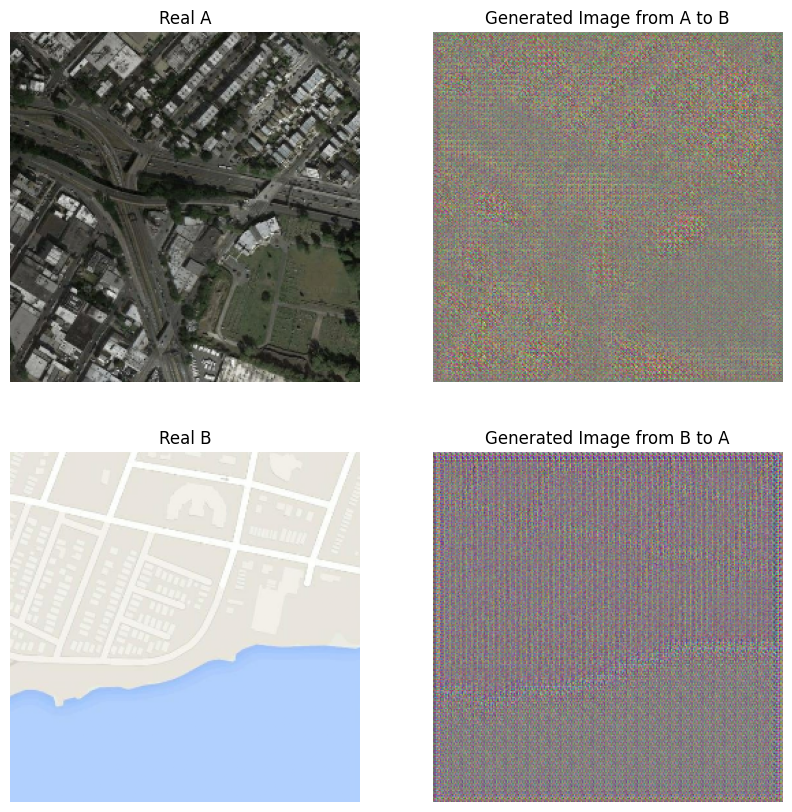

In [ ]:
checkpoint_dir = '/content/drive/My Drive/Cycle_Gan/u_net_train_checkpoint/'
losses_dir = '/content/drive/My Drive/Cycle_Gan/losses_u_net/'
images_dir = '/content/drive/My Drive/Cycle_Gan/generated_images_u_net/'


cycle_gan_with_u_net_generator = CycleGan(u_net_generator(), u_net_generator(), checkpoint_dir=checkpoint_dir, losses_dir=losses_dir, images_dir=images_dir)
cycle_gan_with_u_net_generator.generate_and_save_images(-1, image_batch_A, image_batch_B)

Time for epoch 75 is 79.84
Genarator_A loss : 5.12, Genarator_B loss : 2.98
Identity_A loss : 0.19, Identity_B loss : 0.23
Cycle_A loss : 1.53, Cycle_B loss : 0.90
Total_gen_A loss : 7.74, Total_gen_B loss : 5.64
Discriminator_A loss : 0.13, Discriminator_B loss : 0.01


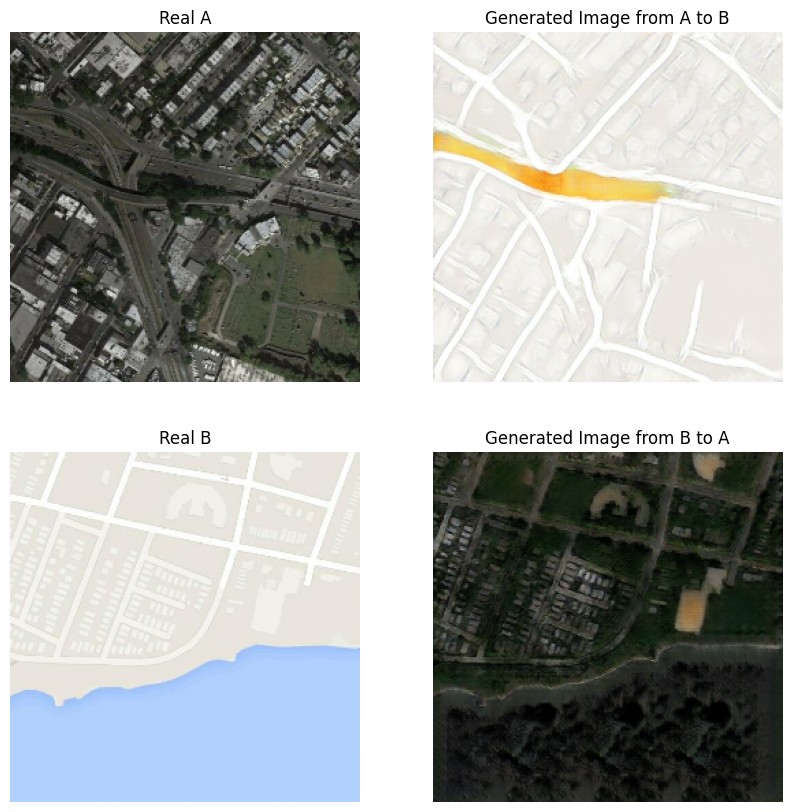

KeyboardInterrupt: 

In [ ]:
cycle_gan_with_u_net_generator.train(train_ds_A, train_ds_B, 200)

# Curve di addestramento

Checkpoint restored from /content/drive/My Drive/Cycle_Gan/train_checkpoint/ckpt-15
Checkpoint restored from /content/drive/My Drive/Cycle_Gan/u_net_train_checkpoint/ckpt-8


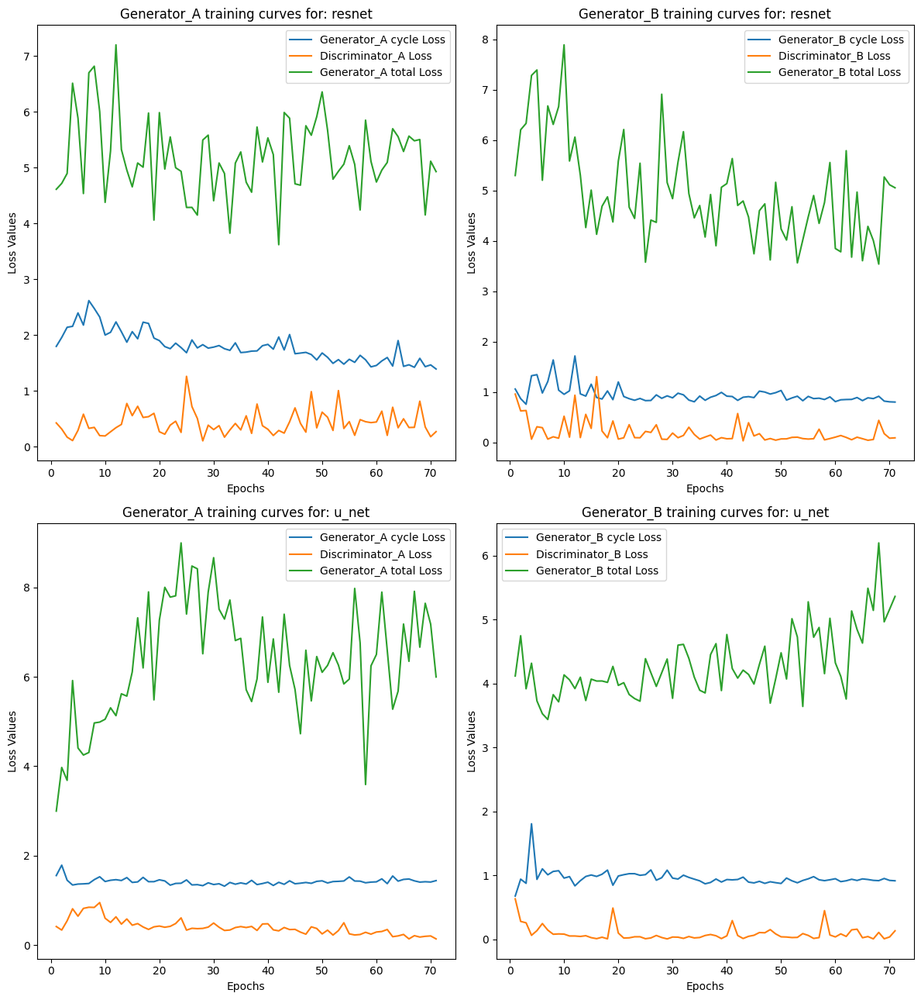

In [ ]:
cycle_gan_with_resnet_generator.restore_checkpoint()
cycle_gan_with_u_net_generator.restore_checkpoint()

plt.figure(figsize=(12, 13))

EPOCHS = 71
plot_offset = 0
for architecture_losses, gen_name in (cycle_gan_with_resnet_generator.get_losses(), 'resnet'), (cycle_gan_with_u_net_generator.get_losses(), 'u_net'):

  for index, label in enumerate(('A', 'B')):
    plt.subplot(2, 2, index + 1 + plot_offset)
    plt.title("Generator_{} training curves for: {}".format(label, gen_name))
    plt.plot(range(1, EPOCHS+1), [loss[index] for loss in architecture_losses['Cycles_loss']], label="Generator_{} cycle Loss".format(label))
    plt.plot(range(1, EPOCHS+1), [loss[index] for loss in architecture_losses['Discs_loss']], label="Discriminator_{} Loss".format(label))
    plt.plot(range(1, EPOCHS+1), [loss[index] for loss in architecture_losses['Gens_loss']], label="Generator_{} total Loss".format(label))
    plt.xlabel("Epochs")
    plt.ylabel("Loss Values")
    plt.legend(loc='best')
  plot_offset += 2

plt.tight_layout()
plt.show()


# Verifica qualitativa dell'architettura

## Verifica qualitativa dei discriminatori

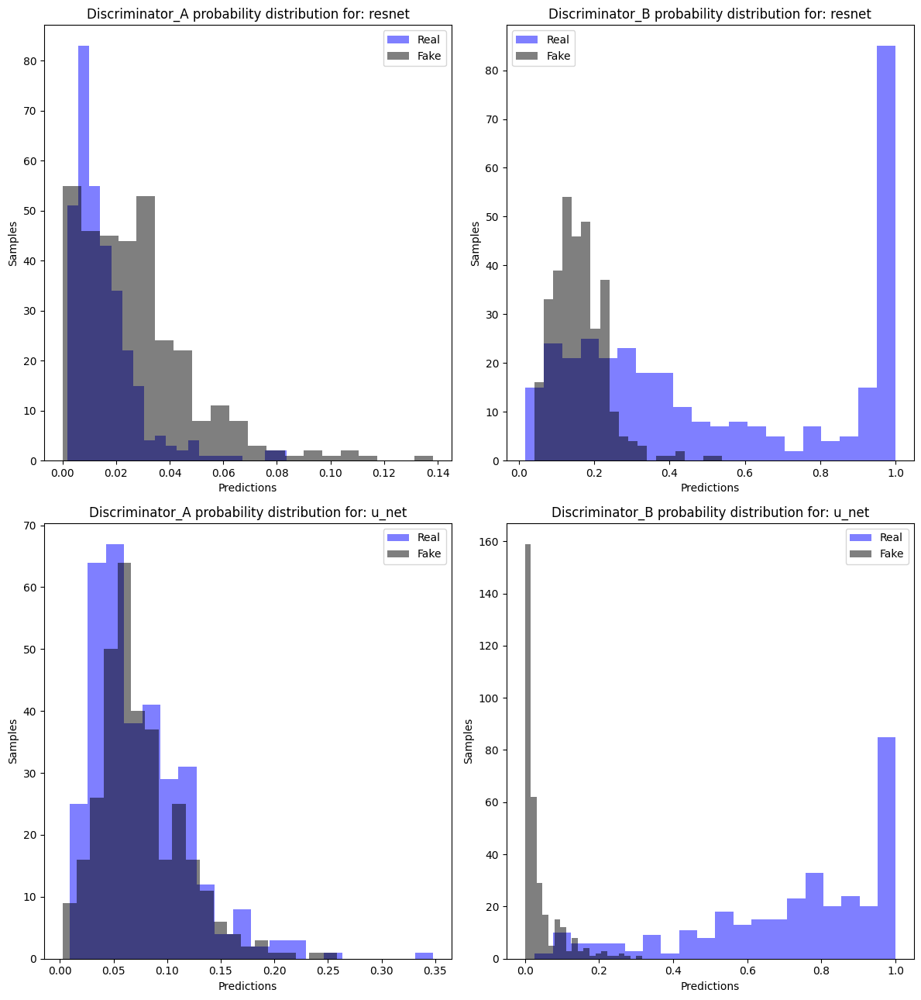

In [ ]:
resnet_predictions = cycle_gan_with_resnet_generator.get_discs_predictions(test_ds_A, test_ds_B)

u_net_predictions = cycle_gan_with_u_net_generator.get_discs_predictions(test_ds_A, test_ds_B)

plt.figure(figsize=(12, 13))
plot_offset = 0
for predictions_dict, gen_name in (resnet_predictions, 'resnet'), (u_net_predictions, 'u_net'):

    for index, label in enumerate(('A', 'B')):
        predictions_real = predictions_dict['disc_{}'.format(label)]['real']
        predictions_fake = predictions_dict['disc_{}'.format(label)]['fake']

        plt.subplot(2, 2, index + 1 + plot_offset)
        plt.title("Discriminator_{} probability distribution for: {}".format(label, gen_name))

        plt.hist(predictions_real, bins=20, alpha=0.5, color='blue', label="Real", )
        plt.hist(predictions_fake, bins=20, alpha=0.5, color='black', label="Fake",)

        plt.xlabel("Predictions")
        plt.ylabel("Samples")
        plt.legend(loc='best')

    plot_offset += 2

plt.tight_layout()
plt.show()

## Verifica qualitativa delle immagini

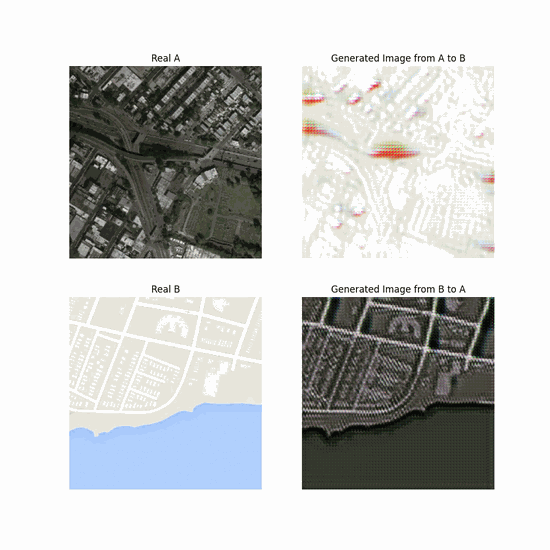

In [ ]:
anim_file_resnet = '/content/drive/My Drive/Cycle_Gan/resnet.gif'
images_folder_resnet = '/content/drive/My Drive/Cycle_Gan/generated_images'


def create_gif(anim_file_path, images_folder):
    with imageio.get_writer(anim_file_path, mode='I') as writer:
        filenames = glob.glob(os.path.join(images_folder, 'image*.png'))
        filenames = sorted(filenames)
        for filename in filenames:
            image = PIL_IMAGE.open(filename)
            image = image.resize((550, 550), PIL_IMAGE.LANCZOS)
            writer.append_data(image)

# Creazione dei due file GIF
create_gif(anim_file_resnet, images_folder_resnet)

embed.embed_file(anim_file_resnet)
display(Image(filename=anim_file_resnet))

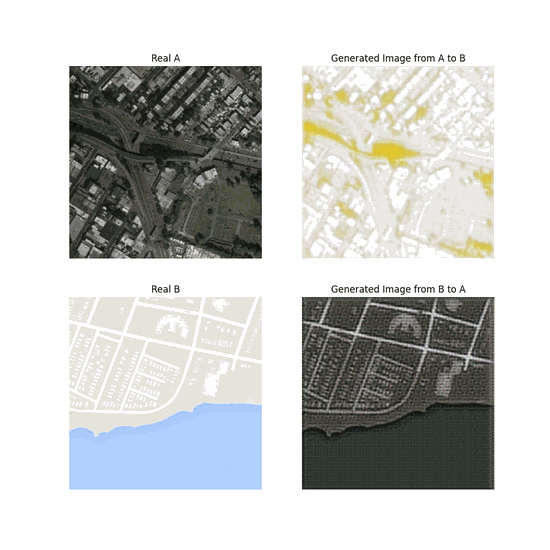

In [ ]:

images_folder_unet = '/content/drive/My Drive/Cycle_Gan/generated_images_u_net'
anim_file_unet = '/content/drive/My Drive/Cycle_Gan/unet.gif'


create_gif(anim_file_unet, images_folder_unet)
embed.embed_file(anim_file_unet)
display(Image(filename=anim_file_unet))

# Trasparenza algoritmica

In [ ]:
num_samples = 30
index = random.randint(0, num_samples)

test_A_sample = np.array([sample.numpy() for sample in test_ds_A.take(num_samples)])
test_B_sample = np.array([sample.numpy() for sample in test_ds_B.take(num_samples)])

test_A_sample = test_A_sample[index]
test_B_sample = test_B_sample[index]

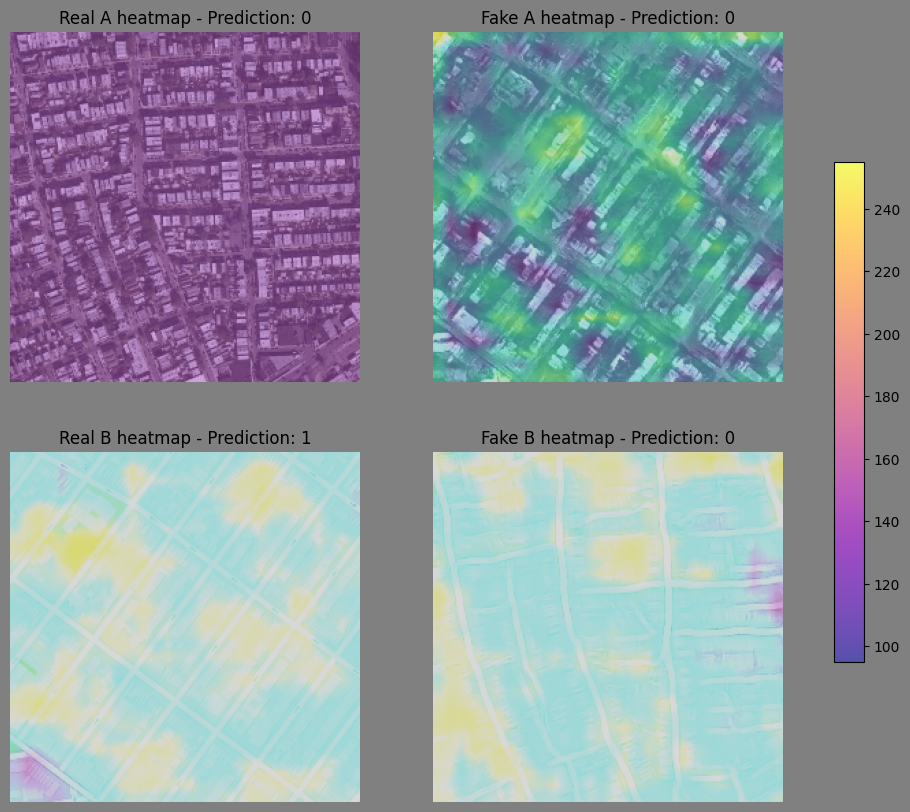

In [ ]:
def plot_heatmap(ax, explainer, image, model, class_index, layer, title):
    heatmap = explainer.explain((image, None), model, class_index=class_index, layer_name=layer)
    ax.set_title('{} heatmap - Prediction: {}'.format(title, class_index))
    im = ax.imshow(heatmap, alpha=0.7, cmap='plasma')
    ax.axis('off')
    return im

last_conv_layer_A = cycle_gan_with_u_net_generator.disc_A.layers[-1].name
last_conv_layer_B = cycle_gan_with_u_net_generator.disc_B.layers[-1].name
predictions = cycle_gan_with_u_net_generator.get_discs_predictions(np.expand_dims(test_A_sample, axis=0), np.expand_dims(test_B_sample, axis=0))

for key, value in predictions.items():
  for k, v in value.items():
      predictions[key][k] = [(x > 0.5).astype('int') for x in v]

explainer_A = GradCAM()
explainer_B = GradCAM()

disc_A = cycle_gan_with_u_net_generator.disc_A
disc_B = cycle_gan_with_u_net_generator.disc_B
gen_A = cycle_gan_with_u_net_generator.gen_A
gen_B = cycle_gan_with_u_net_generator.gen_B

fig, axs = plt.subplots(2, 2, figsize=(10, 10), facecolor='gray')

# Plotting subplots
im_A1 = plot_heatmap(axs[0, 0], explainer_A, test_A_sample, disc_A, predictions['disc_A']['real'][0], last_conv_layer_A, 'Real A')
im_A2 = plot_heatmap(axs[0, 1], explainer_A, gen_B(test_B_sample).numpy(), disc_A, predictions['disc_A']['fake'][0], last_conv_layer_A, 'Fake A')
im_B1 = plot_heatmap(axs[1, 0], explainer_B, test_B_sample, disc_B, predictions['disc_B']['real'][0], last_conv_layer_B, 'Real B')
im_B2 = plot_heatmap(axs[1, 1], explainer_B, gen_A(test_A_sample).numpy(), disc_B, predictions['disc_B']['fake'][0], last_conv_layer_B, 'Fake B')
fig.colorbar(im_B2, orientation='vertical', cax=fig.add_axes([0.95, 0.25, 0.03, 0.5]))
plt.show()
